# TELECOM CHURN CASE STUDY

# Problem Statement:

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, we will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn.


# Business Goal

In this competition, primary goal is to build a machine learning model that is able to predict churning customers based on the features provided for their usage.

# Dataset Description

# File descriptions:


- train.csv: Contains 172 columns. The primary key that represents each customer is id. The target variable that you need to predict is churn_probability which contains a value of 0 or 1. This data is what you are going to use for EDA, cleaning, feature engineering, model building, model evaluation, model selection, and finally model training.

- test.csv: Contains 171 columns, doesn't contain the target variable churn_probability. You will apply all the necessary preprocessing steps to get this data into the right format and then use the model trained using the train.csv file to make predictions with this. This is unseen data! Only the competition hosts know the actual values of the target feature for this data and therefore your submissions will be evaluated on how well your model does with this dataset.

- sample.csv: This contains the format in which you need to submit the solutions to Kaggle. The id column in this dataset exactly the same as the id column in test.csv. You will make your predictions on the test.csv data and store them in a submission file that has the same format as this file. Check the Overview>Evaluation tab for mode details.

- data_dictionary.csv: This contains the definitions for the various acronyms that you will need to understand each variable. For example, the variable total_og_mou_7, contains the acronyms total, og, mou, and 7, which can be translated as the total outgoing minutes of voice calls made by the user in month of July.

# STEP 1: Data Understanding, Preparation, and Pre-Processing :

In [1]:
# importing python and visualization libraries
import pandas as pd, numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import date
import warnings
warnings.filterwarnings('ignore')

In [2]:
# importing Data Preparation libraries
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
#from imblearn.over_sampling import SMOTE
from sklearn.decomposition import IncrementalPCA
from sklearn.model_selection import StratifiedShuffleSplit

In [3]:
# importing libraries for Model building 
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import xgboost as xgb
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.inspection import permutation_importance
from sklearn.tree import DecisionTreeClassifier

In [4]:
# importing libraries for model evaluation
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from scikitplot.metrics import plot_roc_curve
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score

In [5]:
!pip install scikit-plot


[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
pd.options.display.max_columns = 300

In [7]:
# reading the train dataset
telecom = pd.read_csv('train.csv')


In [8]:
# checking the top 5 rows for understanding
telecom.head(5)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,Na

In [9]:
# checking the info of training dataset columns
telecom.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [10]:
# Statistical analysis of the numercial features
telecom.describe().T

,count,mean,std,min,25%,50%,75%,max
id,69999.0,34999.000000,20207.115084,0.0,17499.5,34999.0,52498.5,69998.00
circle_id,69999.0,109.000000,0.000000,109.0,109.0,109.0,109.0,109.00
loc_og_t2o_mou,69297.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00
std_og_t2o_mou,69297.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00
loc_ic_t2o_mou,69297.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00
...,...,...,...,...,...,...,...,...
aon,69999.0,1220.639709,952.426321,180.0,468.0,868.0,1813.0,4337.00
aug_vbc_3g,69999.0,68.108597,269.328659,0.0,0.0,0.0,0.0,12916.22
jul_vbc_3g,69999.0,65.935830,267.899034,0.0,0.0,0.0,0.0,9165.60
jun_vbc_3g,69999.0,60.076740,257.226810,0.0,0.0,0.0,0.0,11166.21


In [11]:
telecom.shape

(69999, 172)

In [12]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 172 entries, id to churn_probability
dtypes: float64(135), int64(28), object(9)
memory usage: 91.9+ MB


In [13]:
telecom.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000

In [14]:
# Checking the missing values and percentage in telecom_churn_Info_df 
missing_df_sum = telecom.isnull().sum().sort_values(ascending=False)
missing_df_percent = (telecom.isnull().sum()/telecom.isnull().count()).sort_values(ascending=False)
missing_df_data = pd.concat([missing_df_sum, missing_df_percent*100], axis=1, keys=['Sum', 'Percent'])
missing_df_data[missing_df_data.Percent >70]

,Sum,Percent
arpu_3g_6,52431,74.902499
count_rech_2g_6,52431,74.902499
night_pck_user_6,52431,74.902499
arpu_2g_6,52431,74.902499
date_of_last_rech_data_6,52431,74.902499
total_rech_data_6,52431,74.902499
av_rech_amt_data_6,52431,74.902499
max_rech_data_6,52431,74.902499
count_rech_3g_6,52431,74.902499
fb_user_6,52431,74.902499


- Here we calculated the missing values sum and percentage for whom the data% is 70%

# Handling missing values

In [15]:
# function to select columns with high missing value
def selecting_columns_for_high_missing_values(telecom, per_miss_value):
    rows = telecom.shape[0]
    miss_cols = []
    null_value_df = telecom.isna()
    for col in null_value_df:
        null_count=telecom[col].isna().sum()
        if (null_count/rows) > per_miss_value:
            miss_cols.append(col)
    return miss_cols

In [16]:
# dropping columns with high missing value
telecom.drop(selecting_columns_for_high_missing_values(telecom, 0.7), inplace=True, axis=1)

# Exploratory Data analysis

In [17]:
# checking for class imbalance
telecom['churn_probability'].value_counts()

churn_probability
0    62867
1     7132
Name: count, dtype: int64

# Checking for Data Imbalance

churn_probability
0    89.811283
1    10.188717
Name: count, dtype: float64


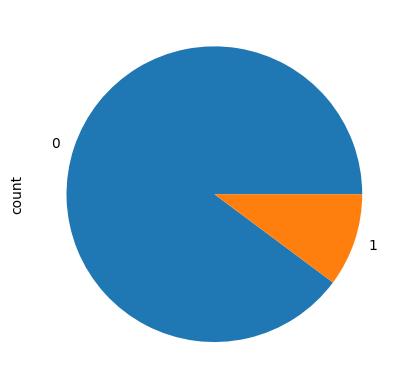

In [18]:
# plot for class imbalance
print((telecom['churn_probability'].value_counts()/len(telecom))*100)
((telecom['churn_probability'].value_counts()/len(telecom))*100).plot(kind="pie")
plt.show()

In [19]:
# checking data again for missing values
# This time less than 70%
missing_df_data[missing_df_data.Percent <= 70]

,Sum,Percent
isd_og_mou_8,3703,5.290076
std_ic_t2o_mou_8,3703,5.290076
std_og_t2c_mou_8,3703,5.290076
std_ic_t2f_mou_8,3703,5.290076
std_og_mou_8,3703,5.290076
...,...,...
last_day_rch_amt_8,0,0.000000
vol_2g_mb_6,0,0.000000
vol_2g_mb_7,0,0.000000
vol_2g_mb_8,0,0.000000


# Observation:

- Most of the missing data shows that the user has not availed the services during that phase. So, its intuitive to fill these values with 0.

In [20]:
# imputing zeroes for null values
telecom=telecom.fillna(0)

In [21]:
telecom.shape

(69999, 142)

In [22]:
# checking for null values
telecom.isna().sum().sum()

0

In [23]:
# Data looks clean with no missing values
# checking againg statistical summary of features
telecom.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69999.0,69999.0,69999.0,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.0,69999.0,69999.0,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.0,69999.0,69999.0,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.00000,69999.000000
mean,34999.000000,109.0,0.0,0.0,0.0,283.134365,278.185912,278.858826,127.887939,128.754731,125.943607,191.010582,189.585401,186.146273,9.379276,6.745305,6.634328,13.625476,9.464386,9.254848,45.050076,44.394344,43.269280,89.551272,87.313796,86.301054,3.595161,3.632045,3.467948,1.081499,1.308807,1.345676,138.203540,135

In [24]:
# checking for unique values
# dropping columns with value equals to 1
unique_values_equals_1=[]
for i in telecom.columns:
    if telecom[i].nunique() == 1:
        unique_values_equals_1.append(i)
    else:
        pass
print("\n List of columns to be dropped from the dataset with only 1 unique value are :\n",
      unique_values_equals_1)
telecom.drop(unique_values_equals_1, axis=1, inplace = True)


 List of columns to be dropped from the dataset with only 1 unique value are :
 ['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']


In [25]:
# looking at statistical summary
# id is different for all customers, so dropping it
# last_date_of_month_7 and last_date_of_month_8, have a fixed value and doesn't seem to be important features
# so, dropping them
drop_cols=['id', 'last_date_of_month_7', 'last_date_of_month_8']

telecom.drop(drop_cols,inplace=True,axis=1)

In [26]:
# let's look at only churn customers
telecom_churn=telecom[telecom['churn_probability'] == 1]

In [27]:
telecom_churn.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.00000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.00000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.0
mean,308.289067,219.081400,114.226380,166.784865,115.935868,49.731139,208.525578,146.238458,62.277647,16.007982,15.519393,14.477426,24.591959,21.067705,20.169801,27.382006,17.480652,7.165370,53.537061,36.110890,14.330600,1.660059,1.291847,0.656748,1.072225,1.327782,0.578655,82.584096,54.887182,22.154563,129.064177,89.399222,33.810116,134.04394,92.975660,34.441896,0.574268,0.487637,0.176948,263.685440,182.864829,68.430024,1.407658,0.873006,0.521457,4.128840,4.236813,1.515799,0.557518,0.010646,0.000530,352.370766,242.877399,92.624937,30.374544,21.802458,7.649083,62.135808,41.270276,16.614169,5.194547,3.662371,1.326970,97.710658,66.739523,25.592482,10.729403,8.061321,2.938589,21.066706,13.852450,

# Univariate and Bivariate

In [28]:
# creating a new dataframe for EDA
telecom_eda_df = telecom.copy()

In [29]:
# Calculate tenure_range
data = telecom_eda_df
#Age on network(aon) - number of days the customer is using the operator T network
data['tenure'] = data['aon']/30
data['tenure'].head()
tenure_range = [0, 6, 12, 24, 60, 61]
tenure_label = [ '0-6 Months', '6-12 Months', '1-2 Yrs', '2-5 Yrs', '5 Yrs and above']
data['tenure_range'] = pd.cut(data['tenure'], tenure_range, labels=tenure_label)
data['tenure_range'].head()

0        NaN
1    1-2 Yrs
2    2-5 Yrs
3    2-5 Yrs
4    1-2 Yrs
Name: tenure_range, dtype: category
Categories (5, object): ['0-6 Months' < '6-12 Months' < '1-2 Yrs' < '2-5 Yrs' < '5 Yrs and above']

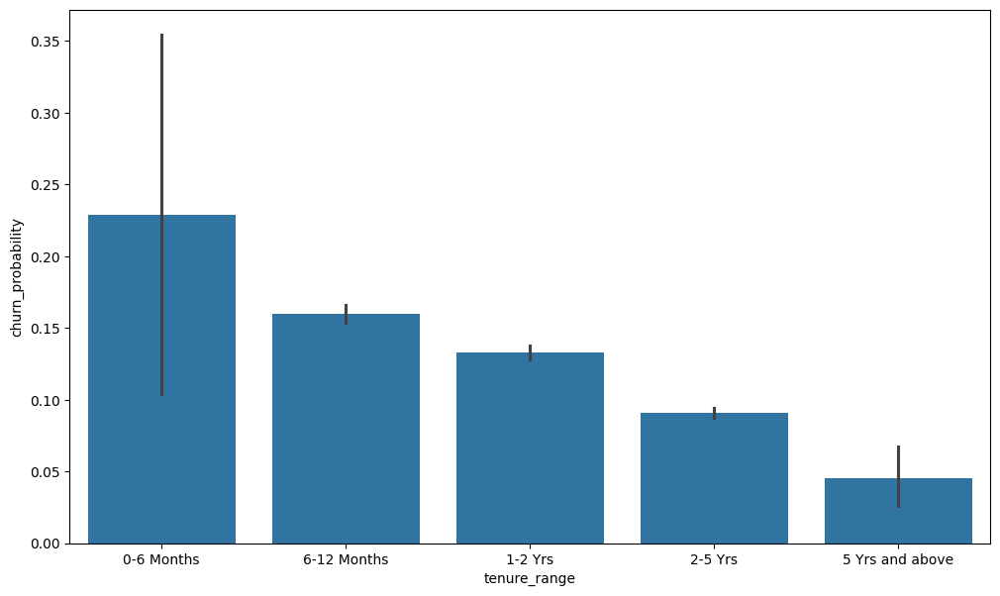

In [30]:
# Plotting a bar plot for tenure range
plt.figure(figsize=[12,7])
sns.barplot(x='tenure_range',y='churn_probability', data=telecom_eda_df)
plt.show()

# Observations:-

- We can observe that customer churn Probability is higher in 0-6 tenure range

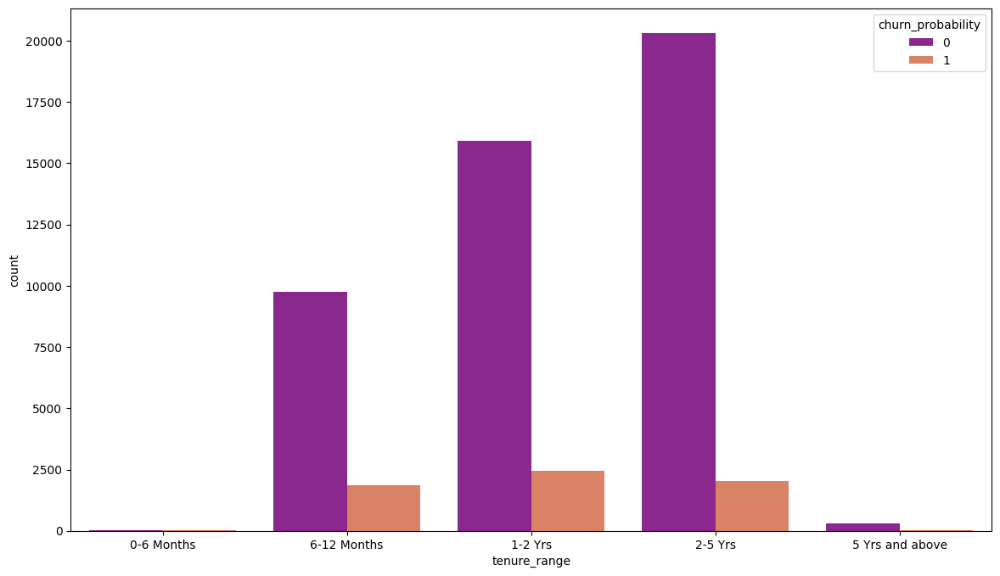

In [31]:
# plot for tenure_range
plt.figure(figsize=(14,8))
sns.countplot(x = 'tenure_range', hue = 'churn_probability',data = data,palette=("plasma"))
plt.show()

# Observations:

- We can observe that customer count for churn probability is lesser as we increase the age on network(tenure)

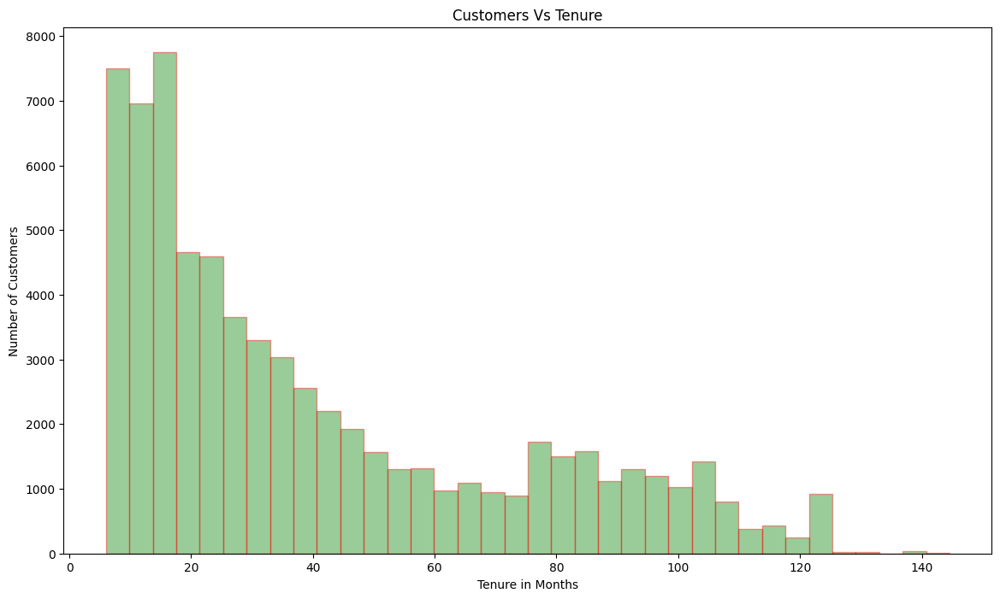

In [32]:
plt.figure(figsize=(14,8))
data = telecom_eda_df
ax = sns.distplot(data['tenure'], hist=True, kde=False, 
             bins=int(180/5), color = 'green', 
             hist_kws={'edgecolor':'red'},
             kde_kws={'linewidth': 4})
ax.set_ylabel('Number of Customers')
ax.set_xlabel('Tenure in Months')
ax.set_title('Customers Vs Tenure')
plt.show()

# Observations-

- We can observe that customer preffered higher tenure is less compared low tenure

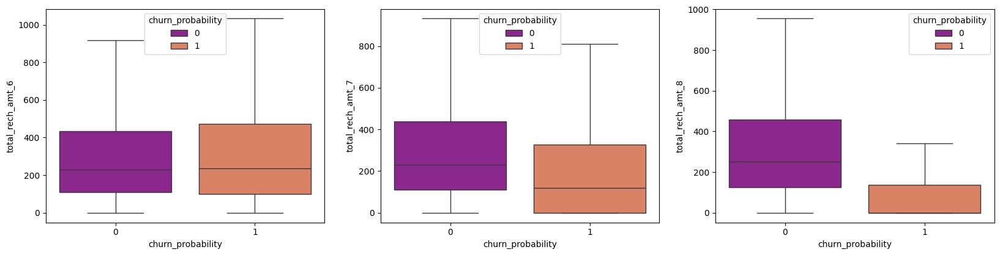

In [33]:
# plot for total_rech_amt for month 6, 7 and 8 months

plt.figure(figsize=(20,10))
data = telecom_eda_df
plt.subplot(2,3,1)
sns.boxplot(data=data, y="total_rech_amt_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,3,2)
sns.boxplot(data=data, y="total_rech_amt_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,3,3)
sns.boxplot(data=data, y="total_rech_amt_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

Obsevations:

- We can observe a good amount of drop in the total recharge amount for churned customers in the 8th Month (Action Phase).

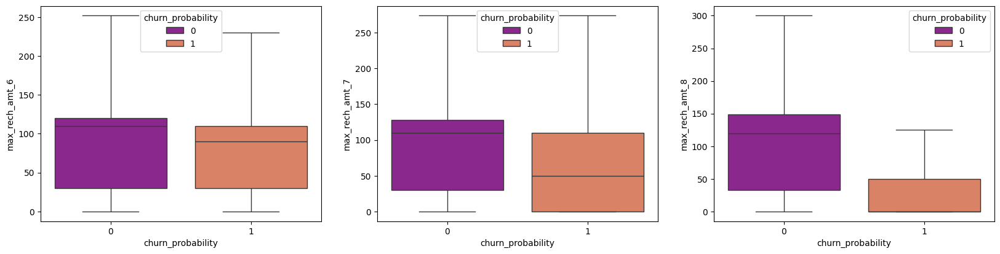

In [34]:
# plot for max_rech_amt for month 6, 7 and 8 months

plt.figure(figsize=(20,10))
data = telecom_eda_df
plt.subplot(2,3,1)
sns.boxplot(data=data, y="max_rech_amt_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,3,2)
sns.boxplot(data=data, y="max_rech_amt_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,3,3)
sns.boxplot(data=data, y="max_rech_amt_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

Observations-

- We can clearly observe that there is a huge drop in maximum recharge amount for data in the 8th month (action phase) for churned customers.

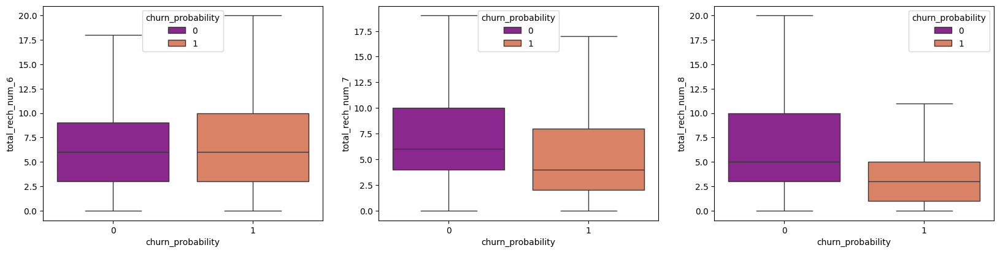

In [35]:
# plot for total_rech_num for month 6, 7 and 8 months
plt.figure(figsize=(20,10))
data = telecom_eda_df
plt.subplot(2,3,1)
sns.boxplot(data=data, y="total_rech_num_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,3,2)
sns.boxplot(data=data, y="total_rech_num_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,3,3)
sns.boxplot(data=data, y="total_rech_num_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

Observations-

- We can observe a huge drop in total recharge number in the 8th month (action phase) for churned customers.

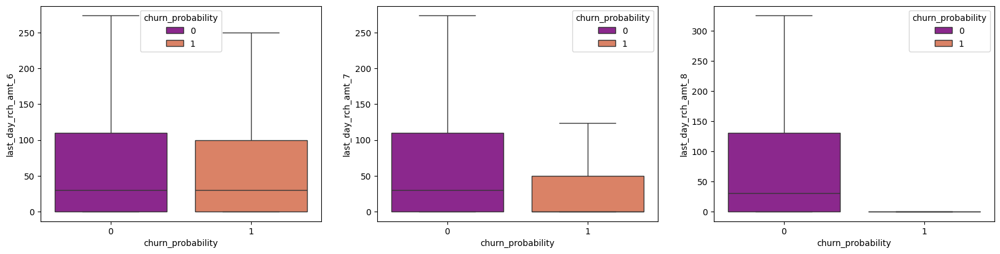

In [36]:
# plot for last_day_rch_amt for month 6, 7 and 8 month
plt.figure(figsize=(20,10))
data = telecom_eda_df
plt.subplot(2,3,1)
sns.boxplot(data=data, y="last_day_rch_amt_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,3,2)
sns.boxplot(data=data, y="last_day_rch_amt_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,3,3)
sns.boxplot(data=data, y="last_day_rch_amt_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

Observations-

- Its clearly visible that we are getting a drop in 8th month recharge amount for churned customers.

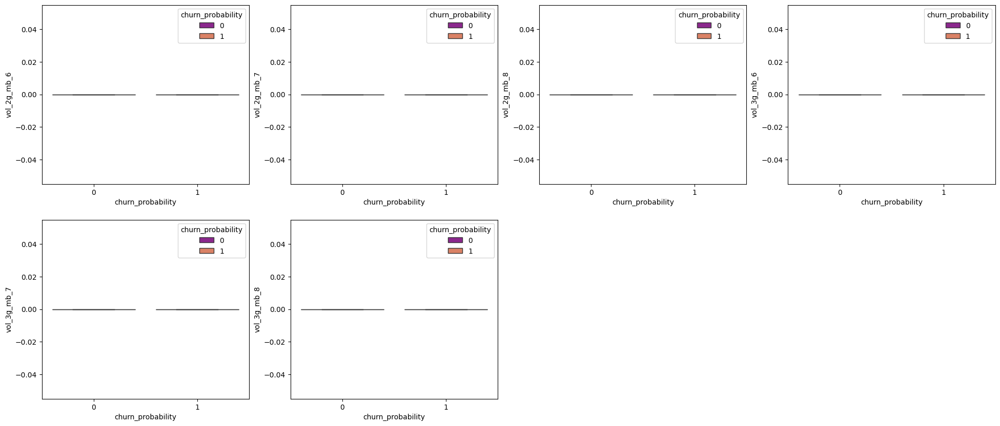

In [37]:
# plot for vol_2g_mb and vol_3g_mb for month 6, 7 and 8 month
plt.figure(figsize=(24,10))
data = telecom_eda_df
plt.subplot(2,4,1)
sns.boxplot(data=data, y="vol_2g_mb_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,4,2)
sns.boxplot(data=data, y="vol_2g_mb_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,4,3)
sns.boxplot(data=data, y="vol_2g_mb_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,4,4)
sns.boxplot(data=data, y="vol_3g_mb_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,4,5)
sns.boxplot(data=data, y="vol_3g_mb_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,4,6)
sns.boxplot(data=data, y="vol_3g_mb_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

Observations-

- We cant infer anything out of 2G/3G volume data for the month 6,7 and 8 as value range is very low, hence graph is not giving us proper justification result. Lets do analysis by checking mean value.

In [38]:
# let's check monthly 2G/3G service schemes
volume_2g_3g = telecom_eda_df.columns[telecom_eda_df.columns.str.contains('vol_2g|vol_3g',regex=True)]
volume_2g_3g.tolist()

['vol_2g_mb_6',
 'vol_2g_mb_7',
 'vol_2g_mb_8',
 'vol_3g_mb_6',
 'vol_3g_mb_7',
 'vol_3g_mb_8']

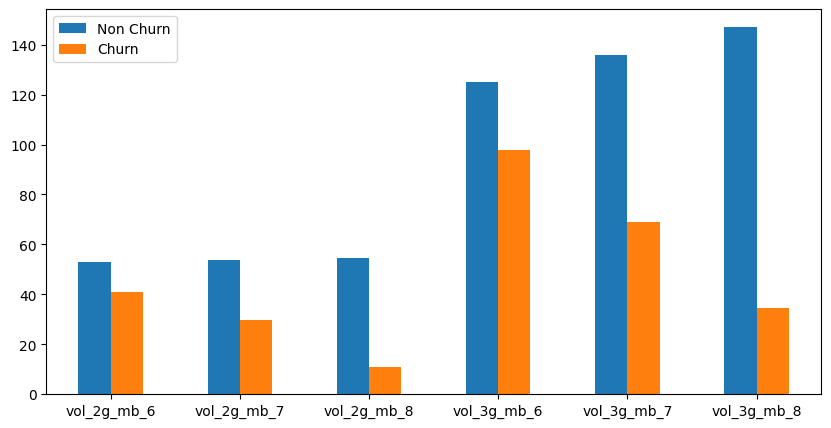

In [39]:
df_0 = telecom_eda_df[telecom_eda_df.churn_probability == 0].filter(volume_2g_3g)
df_1 = telecom_eda_df[telecom_eda_df.churn_probability == 1].filter(volume_2g_3g)

mean_df_0 = pd.DataFrame([df_0.mean()], index=['Non Churn'])
mean_df_1 = pd.DataFrame([df_1.mean()], index=['Churn'])

frames = [mean_df_0, mean_df_1]
mean_bar = pd.concat(frames)

mean_bar.T.plot.bar(figsize=(10, 5), rot=0)
plt.show()

Observations-

- We cant Observe that that for 2g and 3g churn number desreses in the month 8.

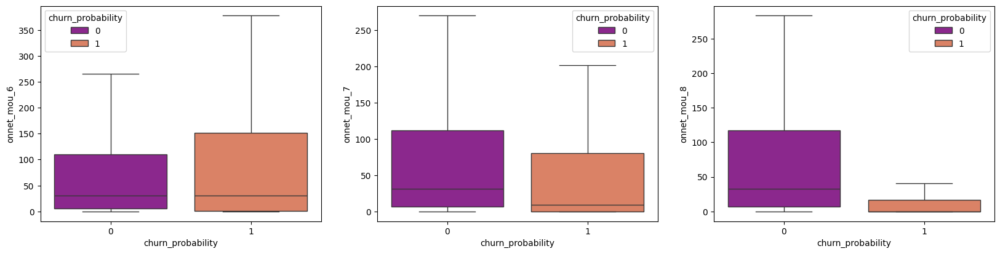

In [40]:
# plot for onnet_mou for month 6, 7 and 8 month
plt.figure(figsize=(20,10))
data = telecom_eda_df
plt.subplot(2,3,1)
sns.boxplot(data=data, y="onnet_mou_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,3,2)
sns.boxplot(data=data, y="onnet_mou_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,3,3)
sns.boxplot(data=data, y="onnet_mou_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

In [41]:
# let's check onnet usage service columns
onnet_usage_service = telecom_eda_df.columns[telecom_eda_df.columns.str.contains('^onnet.*mou',regex=True)]
onnet_usage_service.tolist()

['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8']

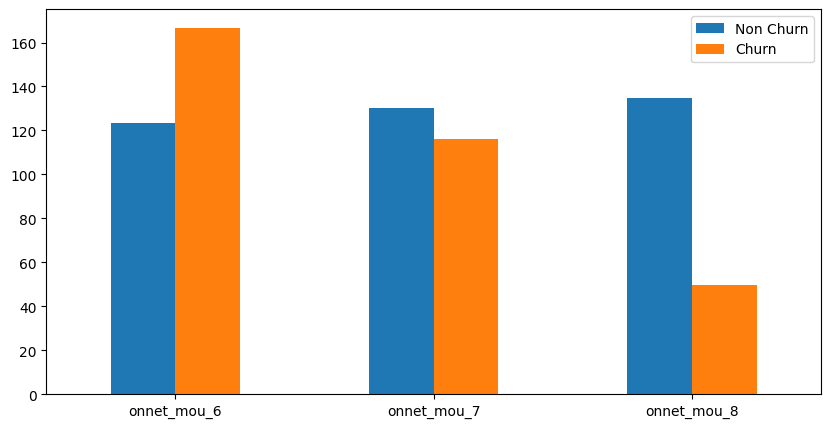

In [42]:
df_0 = telecom_eda_df[telecom_eda_df.churn_probability==0].filter(onnet_usage_service)
df_1 = telecom_eda_df[telecom_eda_df.churn_probability==1].filter(onnet_usage_service)

mean_df_0 = pd.DataFrame([df_0.mean()],index=['Non Churn'])
mean_df_1 = pd.DataFrame([df_1.mean()],index=['Churn'])

frames = [mean_df_0, mean_df_1]
mean_bar = pd.concat(frames)

mean_bar.T.plot.bar(figsize=(10,5),rot=0)
plt.show()

Observations:

- We also observe that there is a drop in Onnet usage services in the 8th month for churned customers

In [43]:
mou_og_cols6 = telecom_eda_df.columns[telecom_eda_df.columns.str.contains('.*_og_.*mou_6',regex=True)]

In [44]:
telecom_eda_df.loc[:,mou_og_cols6].describe()

,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,total_og_mou_6
count,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000
mean,13.625476,45.050076,89.551272,3.595161,1.081499,138.203540,77.431415,84.666274,1.081836,163.182149,0.812319,3.802082,306.451436
std,72.055036,148.238746,159.846546,13.073900,5.631416,248.587898,250.496889,251.251454,7.977166,385.640962,29.153852,15.557032,465.502866
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.010000,7.290000,0.000000,0.000000,12.960000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,44.780000
50%,0.000000,10.660000,37.680000,0.000000,0.000000,59.990000,0.000000,2.910000,0.000000,9.250000,0.000000,0.000000,145.280000
75%,0.000000,38.680000,105.685000,1.860000,0.000000,161.485000,27.160000,49.150000,0.000000,133.890000,0.000000,2.150000,374.305000
max,3775.110000,6431.330000,4696.830000,617.580000,342.860000,10643.380000,7366.580000,8314.760000,628.560000,8432.990000,5900.660000,1023.210000,10674.030000


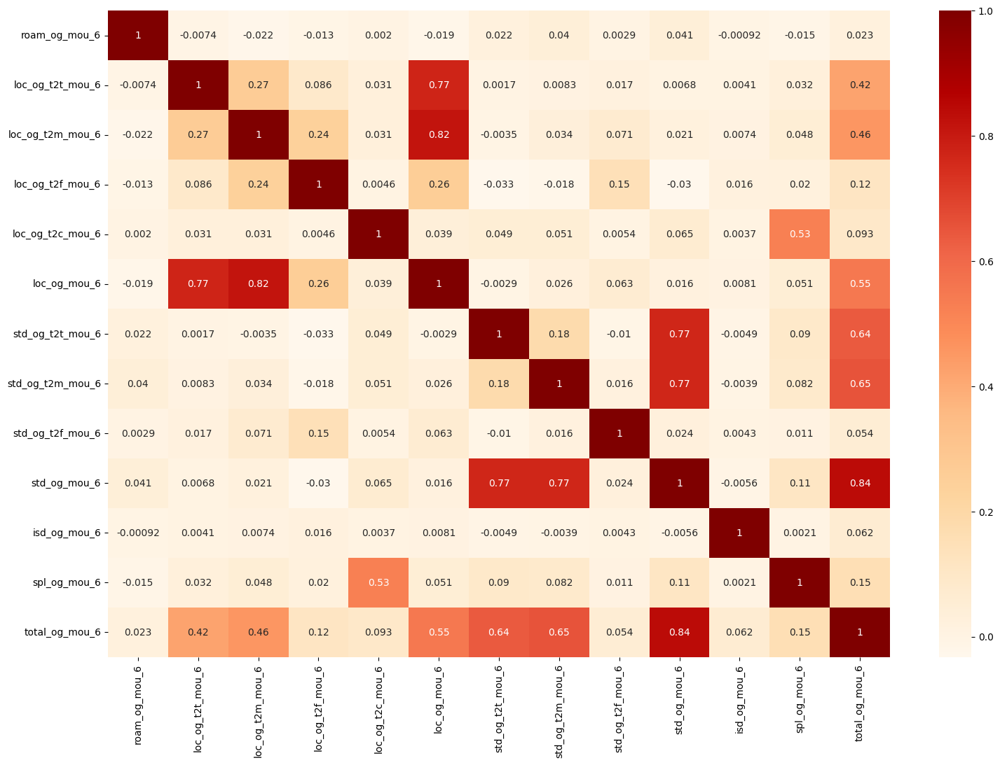

In [45]:
# plotting heatmap for mou_og_cols6
plt.figure(figsize=(18,12))
sns.heatmap(telecom_eda_df.filter(mou_og_cols6).corr(),cmap="OrRd",annot=True)
plt.show()

Observations-

- We can see that total_og_mou_6, std_og_mou_6 and loc_og_mou_6 seems to have strong correlation with other fileds and they needs to be inspected to avoid any multicolinearity issues

In [46]:
imp_features = ['arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_8',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_8',
 'roam_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_8',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'loc_ic_mou_7',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'total_rech_num_7',
 'total_rech_num_8',
 'max_rech_amt_8',
 'last_day_rch_amt_8',
 'aon',
 'churn_probability']

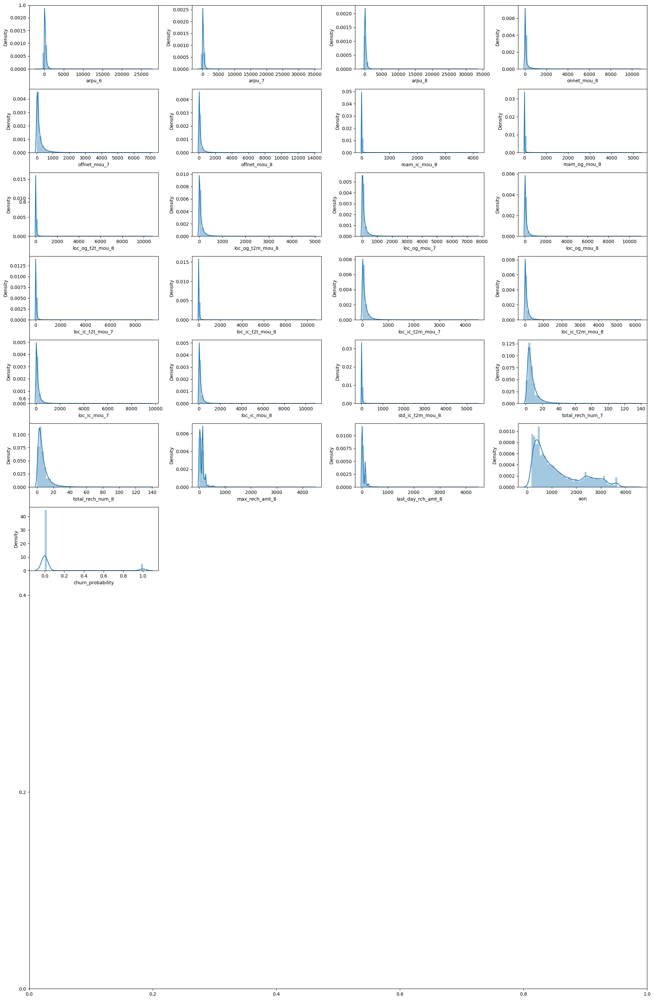

In [47]:
#Visualizing the distribution of each numerical variables
fig=plt.subplots(figsize=(20, 30))

for i, feature in enumerate(imp_features):
    plt.subplot(12, 4, i+1)
    sns.distplot(telecom_eda_df[feature])
    plt.tight_layout()

Observations:-

- distribution looks good in most of the features

# STEP 3 : Feature Engineering and Variable Transformation

In [48]:
# changing object datatype for date columns to datetime
telecom["date_of_last_rech_8"] = pd.to_datetime(telecom['date_of_last_rech_8'], errors='coerce')
telecom["date_of_last_rech_7"] = pd.to_datetime(telecom['date_of_last_rech_7'], errors='coerce')
telecom["date_of_last_rech_6"] = pd.to_datetime(telecom['date_of_last_rech_6'], errors='coerce')

In [49]:
# creating two new columns based on the recharge window
telecom['rchrge2_no_of_days']=(telecom['date_of_last_rech_8'] - telecom['date_of_last_rech_7']).dt.days
telecom['rchrge1_no_of_days']=(telecom['date_of_last_rech_7'] - telecom['date_of_last_rech_6']).dt.days

In [50]:
# dropping date of last recharge columns as we already derived 2 new columns
telecom.drop(['date_of_last_rech_8','date_of_last_rech_7','date_of_last_rech_6'], inplace=True, axis=1)

In [51]:
len(telecom.describe(exclude = ['object']).columns)

127

# High Value Customer churn analysis

In [52]:
# creating a new dataframe for high value customers based on average revenue per month
high_value_cust_df = telecom.copy()

In [53]:
# creating a new column which is a sum of average revenue for june, july, august
high_value_cust_df['arpu'] = high_value_cust_df['arpu_6'] + high_value_cust_df['arpu_7'] + high_value_cust_df['arpu_8']

In [54]:
# filtering top 40 percentile data
limit = high_value_cust_df['arpu'].quantile(0.6)
high_value_cust_df = high_value_cust_df[high_value_cust_df['arpu']>limit]

In [55]:
high_value_cust_corr = high_value_cust_df[high_value_cust_df['churn_probability']==1]
print(len(high_value_cust_corr))
high_value_cust_df.head(5)

1924


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,rchrge2_no_of_days,rchrge1_no_of_days,arpu
11,292.724,228.753,418.233,135.54,63.61,177.36,46.39,65.48,92.81,0.00,0.0,0.0,0.00,0.0,0.0,86.39,27.59,82.33,43.28,29.49,83.54,0.58,0.36,0.00,2.53,0.0,0.0,130.26,57.46,165.88,49.14,36.01,95.03,0.00,35.61,9.26,0.0,0.00,0.00,49.14,71.63,104.29,0.0,0.0,0.0,2.53,0.00,0.35,0.0,0.0,0.0,181.94,129.09,270.53,66.34,62.03,115.13,60.46,45.23,61.26,0.38,0.00,0.41,127.19,107.26,176.81,6.73,44.76,86.19,0.00,2.65,18.96,0.00,0.00,0.00,6.73,47.41,105.16,133.93,154.68,281.98,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,10,6,8,410,220,460,110,50,130,110,50,50,0.00,0.0,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,648,0.0,0.0,0.0,0,27.0,33.0,939.710
12,439.919,397.946,392.024,244.46,108.31,42.98,571.98,727.91,644.43,0.00,0.0,0.0,0.00,0.0,0.0,0.00,7.86,3.98,44.01,13.93,51.24,0.00,0.00,0.00,0.00,0.0,0.0,44.01,21.79,55.23,244.46,100.44,38.99,527.96,713.98,593.18,0.0,0.00,0.00,772.43,814.43,632.18,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,816.44,836.23,687.41,0.00,0.53,1.06,26.93,25.68,23.46,0.00,0.00,0.00,26.93,26.21,24.53,0.23,0.00,0.00,7.33,8.64,2.46,0.00,0.48,0.00,7.56,9.13,2.46,34.49,35.34,26.99,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,15,10,20,521,418,365,110,110,50,110,0,0,0.00,0.0,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,322,0.0,0.0,0.0,0,31.0,31.0,1229.889
15,580.549,377.294,338.286,10.43,24.99,194.43,317.11,341.79,197.09,0.00,0.0,0.0,0.00,0.0,0.0,10.43,24.99,194.43,313.76,330.88,185.88,3.26,10.91,4.94,0.00,0.0,0.0,327.46,366.79,385.26,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,6.26,0.00,0.00,6.26,0.0,0.0,0.0,0.08,0.00,0.00,0.1,0.0,0.0,327.64,366.79,391.53,13.86,20.18,335.43,219.31,754.24,285.63,0.00,1.93,8.88,233.18,776.36,629.94,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.03,0.00,0.00,1.03,0.00,233.18,777.39,629.94,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,5,3,4,654,400,652,250,250,250,0,150,250,260.42,0.0,354.35,0.0,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,602,0.0,0.0,0.0,0,36.0,28.0,1296.129
22,277.458,283.346,231.755,179.54,287.98,155.16,335.41,255.18,281.06,12.58,0.0,0.0,16.73,0.0,0.0,173.33,287.98,155.16,321.29,249.88,266.99,0.00,4.88,2.81,0.00,0.0,0.0,494.63,542.74,424.98,0.00,0.00,0.00,0.00,0.00,0.00,3.6,0.41,0.00,3.60,0.41,0.00,0.0,0.0,0.0,0.00,0.00,11.24,0.0,0.0,0.0

# Observation-

- There are very few records of high value customers.

- This can not be used for modelling, however, we can take this sample to analyze general trend

<Axes: xlabel='churn_probability', ylabel='arpu'>

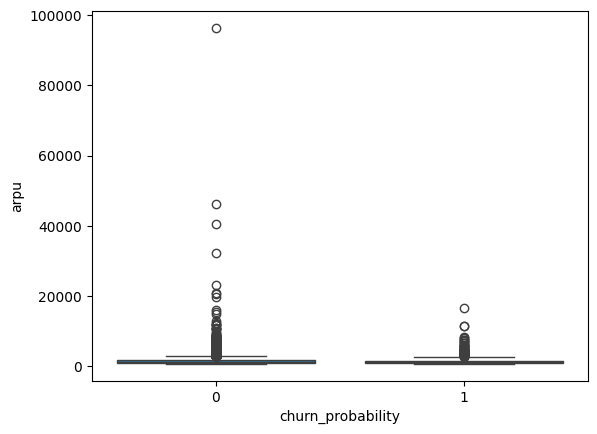

In [56]:
sns.boxplot(x="churn_probability", y="arpu", data=high_value_cust_df)

# OBSERVATION-

- No clear inference can be drawn

In [57]:
high_value_cust_df.groupby(by=['churn_probability']).mean()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,rchrge2_no_of_days,rchrge1_no_of_days,arpu
churn_probability,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,490.681807,510.959220,520.941924,235.68780,256.180713,255.655767,344.524672,364.189681,364.158543,14.212041,10.423870,10.200683,23.311140,15.937731,15.912002,82.871440,85.632557,84.108846,160.242246,163.115321,162.566973,6.332863,6.543573,6.284959,1.432757,1.739946,1.869534,249.455115,255.300372,252.969656,143.617534,164.267953,165.522937,156.095392,176.905053,177.072307,1.812487,1.787613,1.731899,301.529343,342.964675,344.331104,1.685259,1.740855,1.856257,5.292110,6.891501,7.294502,0.652186,0.046960,0.05938,558.623105,606.952844,606.519520,63.532090,66.239424,66.631075,148.111011,152.791675,155.647146,15.332064,16.553779,15.438037,226.984847,235.594959,237.726391,13.256315,14.725817,14.807114,28.439031,30.988766,30.700351,2.757959,2.917752,2.653890,44.456890,48.636126,48.165174,282.687371,297.099140,298.713102,0.065309,0.020098,0.033817,10.056494,11.450100,11.492316,1.115565,1.389980,1.287363,10.655277,11.099057,10.621069,573.259434,596.219551,604.721085,152.121721,157.451987,164.728985,93.428747,94.328808,98.026001,73.234356,74.655207,74.494027,224.356778,247.606614,265.780938,0.120034,0.131117,0.128432,0.486578,0.587015,0.650637,0.144961,0.157501,0.167242,0.121951,0.136869,0.145076,1299.097714,128.087851,122.410888,108.696865,30.691024,31.154931,1522.58295
1,646.398712,537.795529,289.464999,392.63841,321.986861,145.295899,471.947302,386.176554,168.809122,28.315431,30.694834,30.862692,51.961616,48.751705,50.277864,58.154485,44.119496,19.940457,108.365821,88.467199,36.780915,3.506767,3.150489,1.766258,1.578841,2.116159,1.072282,170.034122,135.743825,58.491232,312.554298,256.632053,102.981445,320.128311,258.898633,98.638165,1.231237,1.200780,0.418332,633.918477,516.735847,202.040203,4.384558,2.895255,1.781674,6.634532,7.476169,3.320239,0.780083,0.000936,0.00104,815.761783,662.860062,265.639298,45.290582,41.088695,15.704168,98.941902,81.178067,35.038789,7.922152,6.767983,2.858430,152.162495,129.041892,53.605639,21.325977,17.345806,5.871045,34.743519,29.661887,12.650634,1.557209,1.589771,0.530348

OBSERVATIONS:

- We can see that there is a monotonous decreasing trend for average revenue per user for churned customers from the month of june to august
- A similar trend is seen for onnet_mou, offnet_mou, loc_og_t2t_mou, loc_og_t2m_mou, loc_og_t2f_mou , loc_og_mou, std_og_t2t_mou, std_og_t2m_mou, std_og_mou, isd_og_mou,spl_og_mou, total_og_mou...etc mou features.
- Average age on networn - aon is less for churned customers then new customers. So, relatively new customers are more likely to churn
- We can infer that if a customers have reduced usage of services and is relatively new then, he/she is most likely to churn

# Correlation Analysis

In [58]:
# Plotting cluster map to check correlation between features
sns.clustermap(telecom.corr(), annot=True, cmap="RdBu", figsize=(200,200))

In [59]:
# function to remove correlation more than a threshold value
def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] >= threshold) and (corr_matrix.columns[j] not in col_corr):
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname] # deleting the column from the dataset

In [60]:
# dropping highly correlated columns
df_new = telecom.copy()
correlation(df_new,0.85)
df_new

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,rchrge2_no_of_days,rchrge1_no_of_days
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,18.75,0.00,0.0,0.0,65.09,204.99,1.01,0.00,8.20,0.63,0.00,0.38,0.0,0.0,81.21,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.00,0.0,0.0,0.66,0.00,0.0,0.00,1.11,0.69,0.00,3,2,2,65,65,10,65,65,0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,1958,0.00,0.00,0.00,0,45.0,18.0
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,30.73,31.66,0.00,0.0,0.0,0.00,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.01,0.00,0.0,0.00,0.00,0.00,0.00,3,4,5,0,145,50,0,0,0,0.00,352.91,0.00,0.00,3.96,0.00,0,0,0,0,0,0,0,1,0,0,0,0,710,0.00,0.00,0.00,0,47.0,28.0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,28.94,0.00,0.0,0.0,28.94,84.99,0.00,0.00,2.89,1.38,0.00,0.00,0.0,0.0,56.49,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.25,2,4,2,70,70,0,70,50,0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,882,0.00,0.00,0.00,0,33.0,41.0
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,15.33,0.56,0.0,0.0,16.16,37.99,4.60,0.00,14.95,9.13,25.61,0.00,0.0,0.0,76.03,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.00,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,2,4,3,110,110,50,110,110,50,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,982,0.00,0.00,0.00,0,35.0,36.0
4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,0.0,0.0,15.73,0.0,0.00,10.16,4.83,6.13,36.74,19.88,4.61,11.99,1.23,5.01,0.00,9.85,0.00,58.91,25.94,15.76,4.35,0.00,0.0,0.0,4.35,0.00,0.00,0.00,0.00,17.00,0.00,0.00,0.0,0.0,63.26,5.44,1.39,2.66,10.58,4.33,19.49,5.51,3.63,6.14,21.54,9.36,28.31,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,13,10,8,50,41,30,25,10,30,390.80,308.89,213.47,0.00

# Observation-

- It's difficult to see correlation with so many features. Let's do feature selection using Random Forest or RFE

# STEP 4 : Model Selection, Model Building, and Prediction

# Feature Selection using Random Forest Classifier

In [61]:
feature_telecom = df_new.copy()
y = feature_telecom.pop('churn_probability')
X = feature_telecom

# using stratified splitting to maintain similar percentage of churned customers
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state=42)

In [62]:
best_feature_names = [f"feature {i}" for i in range(X.shape[1])]
random_forest = RandomForestClassifier(random_state=0)
missing_values = X_train.isnull().sum()
X_train_no_missing = X_train.dropna()
y_train_no_missing = y_train.loc[X_train_no_missing.index]
random_forest.fit(X_train_no_missing, y_train_no_missing)

RandomForestClassifier(random_state=0)

count    108.000000
mean       0.009259
std        0.012020
min        0.000121
25%        0.002770
50%        0.006624
75%        0.010681
max        0.086118
dtype: float64

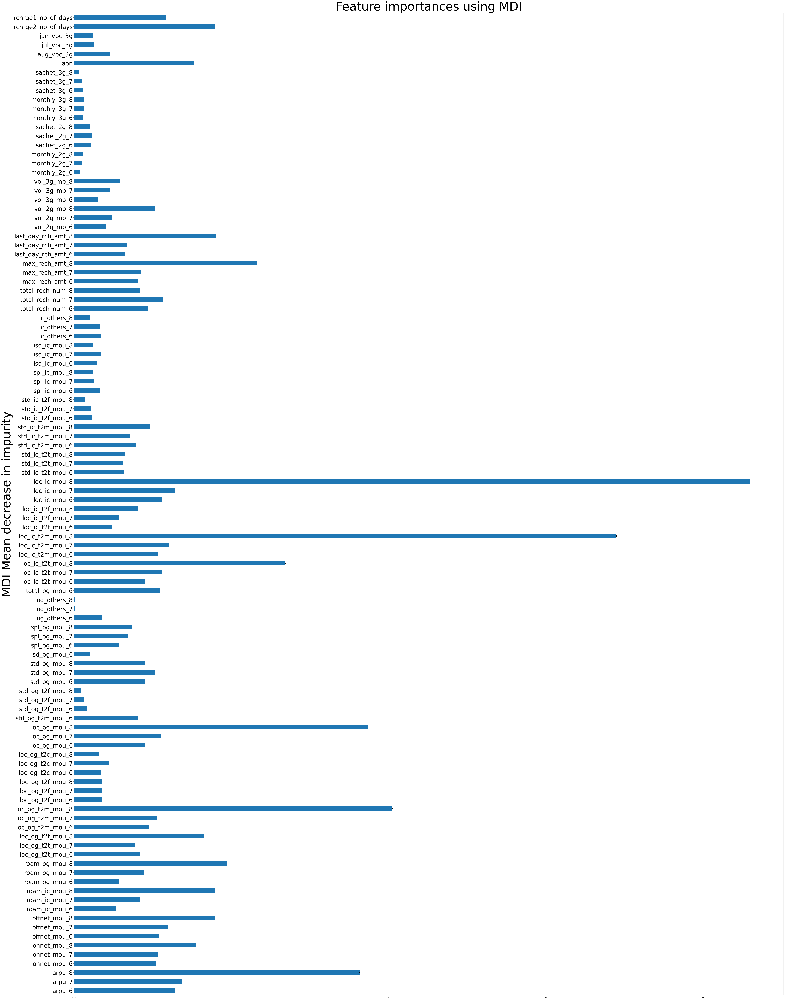

In [63]:
# plotting features based on Mean Decrease in Immunity
importances = random_forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in random_forest.estimators_], axis=0)
forest_importances = pd.Series(importances, index=X_train.columns)

fig, ax = plt.subplots(figsize=(55,70))
forest_importances.plot.barh(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI", fontsize = 60)
ax.set_ylabel("MDI Mean decrease in impurity", fontsize = 60)
ax.tick_params(axis='y', labelsize=30)
fig.tight_layout()
forest_importances.describe()

In [64]:
# selecting the most important features
feature_imp_df = pd.DataFrame(forest_importances)
feature_imp_df.reset_index(inplace=True)
feature_imp_df.columns=['features',"importance"]
len(feature_imp_df[feature_imp_df['importance'] > 0.01])

33

In [65]:
feature_imp_df = feature_imp_df[feature_imp_df['importance']>0.01]
imp_columns = list(feature_imp_df.features)
imp_columns.append('churn_probability')
imp_columns

['arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_8',
 'roam_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_mou_7',
 'total_og_mou_6',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'loc_ic_mou_6',
 'loc_ic_mou_7',
 'loc_ic_mou_8',
 'total_rech_num_7',
 'max_rech_amt_8',
 'last_day_rch_amt_8',
 'vol_2g_mb_8',
 'aon',
 'rchrge2_no_of_days',
 'rchrge1_no_of_days',
 'churn_probability']

In [66]:
# new Dataframe with feature selection
telecom_imp_feautures_df = df_new[imp_columns].dropna()

In [67]:
telecom_imp_feautures_df.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_mou_7,loc_og_mou_8,std_og_mou_7,total_og_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,total_rech_num_7,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,aon,rchrge2_no_of_days,rchrge1_no_of_days,churn_probability
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.0,0.00,0.28,16.04,2.33,16.04,2.61,204.99,81.21,3.68,7.79,0.83,21.08,16.91,3.26,24.76,24.71,2,10,0,0.00,1958,45.0,18.0,0
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,19.09,10.53,1.41,18.68,11.09,3.44,39.44,25.03,4,50,0,0.00,710,47.0,28.0,0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.0,0.00,0.00,0.00,0.00,12.98,0.00,84.99,56.49,6.16,6.49,89.86,25.18,23.51,94.38,31.34,30.01,4,0,0,0.00,882,33.0,41.0,0
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.0,1.63,0.00,44.89,23.63,48.84,23.63,37.99,76.03,4.84,23.88,53.99,44.23,57.14,86.21,49.89,81.03,4,50,50,0.00,982,35.0,36.0,0
4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,0.0,0.00,6.13,19.88,4.61,25.94,15.76,0.00,63.26,1.39,2.66,10.58,4.33,19.49,21.54,9.36,28.31,10,30,30,213.47,647,35.0,31.0,0


- Splitting the Data over here

In [68]:
# train-test split in the ratio 80-20
y=telecom_imp_feautures_df.pop('churn_probability')
X=telecom_imp_feautures_df
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=100)

- Scaling the data

In [69]:
# using standard scalar for scaling
scaler = StandardScaler()

In [70]:
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
# checking for scaled data
X_train_scaled_df.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_mou_7,loc_og_mou_8,std_og_mou_7,total_og_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,total_rech_num_7,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,aon,rchrge2_no_of_days,rchrge1_no_of_days
count,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04
mean,-1.775145e-16,-4.915992e-17,7.407660e-18,7.643358e-17,9.535679e-17,1.162329e-16,7.003606e-17,2.963064e-18,3.905857e-18,-3.340181e-17,3.151623e-17,-1.589280e-17,7.946399e-18,2.215564e-17,4.848650e-18,6.761173e-17,-2.080879e-17,-6.276308e-17,-3.986668e-17,2.693695e-17,6.626488e-17,-3.272839e-17,6.417727e-17,-2.747568e-17,2.071451e-16,-1.319910e-17,5.360452e-17,-3.316611e-17,-4.208898e-17,-2.747568e-17,-6.680362e-17,1.569077e-17,-2.094347e-16
std,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00
min,-1.328250e+00,-2.557460e+00,-1.740193e+00,-4.396731e-01,-4.275151e-01,-4.218747e-01,-6.181667e-01,-6.083452e-01,-6.008761e-01,-1.272489e-01,-1.485869e-01,-3.044277e-01,-5.910493e-01,-5.926723e-01,-5.726235e-01,-5.762194e-01,-4.267537e-01,-6.703450e-01,-3.218016e-01,-3.295382e-01,-6.344326e-01,-6.465508e-01,-6.398247e-01,-6.607597e-01,-6.533757e-01,-6.582936e-01,-9.908198e-01,-8.999552e-01,-6.321863e-01,-2.402882e-01,-1.100885e+00,-4.122242e+00,-4.353350e+00
25%,-5.677282e-01,-5.442519e-01,-5.392123e-01,-4.190589e-01,-4.080632e-01,-4.048459e-01,-5.205001e-01,-5.146454e-01,-5.137943e-01,-1.272489e-01,-1.485869e-01,-2.962910e-01,-5.306882e-01,-5.380086e-01,-5.062936e-01,-5.140898e-01,-4.267537e-01,-5.676904e-01,-3.020771e-01,-3.105439e-01,-5.415960e-01,-5.392932e-01,-5.408242e-01,-5.504879e-01,-5.325653e-01,-5.415280e-01,-5.657972e-01,-6.572458e-01,-6.321863e-01,-2.402882e-01,-7.941322e-01,-3.812002e-01,-4.900328e-01
50%,-2.535487e-01,-2.457452e-01,-2.379920e-01,-3.313809e-01,-3.265318e-01,-3.243625e-01,-3.252782e-01,-3.271680e-01,-3.243977e-01,-1.272489e-01,-1.485869e-01,-2.290956e-01,-3.330894e-01,-3.357335e-01,-3.182021e-01,-3.204235e-01,-4.015636e-01,-3.484083e-01,-2.175528e-01,-2.217380e-01,-3.051870e-01,-3.039259e-01,-3.001194e-01,-3.009392e-01,-2.939047e-01,-2.942525e-01,-2.824488e-01,-9.092399e-02,-3.389754e-01,-2.402882e-01,-3.644685e-01,3.447119e-02,-6.077540e-02
75%,2.648531e-01,2.465141e-01,2.520180e-01,-4.694423e-02,-6.036732e-02,-6.216644e-02,1.067554e-01,9.727286e-02,1.060221e-01,-1.272489e-01,-1.485869e-01,-3.890065e-02,1.127695e-01,1.229049e-01,9.841795e-02,1.099301e-01,-6.624773e-02,1.509025e-01,-1.556233e-02,-8.547373e-03,1.540207e-01,1.513988e-01,1.629155e-01,1.707595e-01,1.582066e-01,1.672903e-01,2.842480e-01,2.731400e-01,6.383945e-01,-2.402882e-01,6.282753e-01,4.501426e-01,5.115678e-01
max,8.151150e+01,9.791789e+01,9.116372e+01,2.457098e+01,2.575810e+01,3.175670e+01,2.600689e+01,2.035578e+01,4.321321e+01,7.644245e+01,8.400050e+01,6.587770e+01,2.927580e+01,3.204322e+01,3.087066e+01,4.182840e+01,1.944159e+01,1.760501e+01,6.288266e+01,7.547952e+01,2.628797e+01,2.397884e+01,3.709699e+01,2.946423e+01,3.751145e+01,4.273877e+01,1.841855e+01,3.509384e+01,4.285100e+01,4.9

# Now building the model with various machine learning algorithms

# 1. Logistic Regression after Random Forest feature selection

In [71]:
# Logistic regression model
model_columns = list(X_train_scaled_df.columns)
model_columns=['const'] + model_columns
logm1 = sm.GLM(y_train,(sm.add_constant(X_train_scaled)), family = sm.families.Binomial())
logm1.fit().summary(xname=model_columns)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                52756
Model:                            GLM   Df Residuals:                    52722
Model Family:                Binomial   Df Model:                           33
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11102.
Date:                Wed, 06 Mar 2024   Deviance:                       22203.
Time:                        15:57:09   Pearson chi2:                 1.13e+12
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1409
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.2197      0.052    -80.568      0.000      -4.322      -4.117
arpu_6                 0.2606      0.043      6.018      0.000       0.176       0.346
arpu_7                 0.2812      0.054      5.250      0.000       0.176       0.386
arpu_8                -0.5491      0.071     -7.697      0.000      -0.689      -0.409
onnet_mou_6            0.2358      0.077      3.060      0.002       0.085       0.387
onnet_mou_7            0.3123      0.103      3.028      0.002       0.110       0.514
onnet_mou_8           -0.2160      0.049     -4.373      0.000      -0.313      -0.119
offnet_mou_6           0.2193      0.082      2.665      0.008       0.058       0.381
offnet_mou_7           0.3477      0.104      3.336      0.001       0.143       0.552
offnet_mou_8          -0.3074      0.058     -5.310      0.000      -0.421      -0.194
roam_ic_mou_8          0.0350      0.014      2.474      0.013       0.007       0.063
roam_og_mou_8          0.1971      0.019     10.251      0.000       0.159       0.235
loc_og_t2t_mou_8       0.1625      0.629      0.258      0.796      -1.071       1.396
loc_og_t2m_mou_7      -0.0531      0.079     -0.671      0.502      -0.208       0.102
loc_og_t2m_mou_8      -0.0295      0.664     -0.044      0.965      -1.331       1.272
loc_og_mou_7          -0.2269      0.113     -2.003      0.045      -0.449      -0.005
loc_og_mou_8          -0.3860      1.022     -0.378      0.706      -2.389       1.617
std_og_mou_7          -0.3374      0.123     -2.740      0.006      -0.579      -0.096
total_og_mou_6        -0.2524      0.110     -2.295      0.022      -0.468      -0.037
loc_ic_t2t_mou_7      -0.0315      0.173     -0.183      0.855      -0.370       0.307
loc_ic_t2t_mou_8       2.1597      0.477      4.526      0.000       1.225       3.095
loc_ic_t2m_mou_6       0.0023      0.055      0.041      0.967      -0.105       0.110
loc_ic_t2m_mou_7      -0.0867      0.199     -0.435      0.664      -0.477       0.304
loc_ic_t2m_mou_8       1.4246      0.566      2.516      0.012       0.315       2.534
loc_ic_mou_6           0.0779      0.055      1.421      0.155      -0.030       0.185
loc_ic_mou_7           0.4875      0.289      1.686      0.092      -0.079       1.054
loc_ic_mou_8          -5.8850      0.806     -7.299      0.000      -7.465      -4.305
total_rech_num_7      -0.1311      0.025     -5.185      0.000      -0.181      -0.082
max_rech_amt_8        -0.0738      0.034     -2.153      0.031      -0.141      -0.007
last_day_rch_amt_8    -0.5769      0.043    -13.524      0.000      -0.661      -0.493
vol_2g_mb_8           -0.4954      0.051     -9.771      0.000      -0.595      -0.396
aon                   -0.3206      0.024    -13.137      0.000      -0.368      -0.273
rchrge2_no_of_days    -0.2836      0.0

# Observations-

- p-values for many features are insignificant
- Let's do an RFE for top 15

# 2.Logistic Regression with RFE

In [72]:
log_reg = LogisticRegression()

In [73]:
# fitting RFE for 15 features
rfe = RFE(log_reg, n_features_to_select=15)
rfe = rfe.fit(X_train_scaled, y_train)

In [74]:
rfe_cols = X_train_scaled_df.columns[rfe.support_]
rfe.support_

array([ True, False,  True, False,  True, False, False,  True,  True,
       False, False, False, False, False,  True,  True,  True, False,
        True,  True, False,  True, False, False, False,  True, False,
       False,  True,  True,  True, False, False])

In [75]:
# checking RFE selected columns
list(zip(X_train_scaled_df.columns, rfe.support_, rfe.ranking_))

[('arpu_6', True, 1),
 ('arpu_7', False, 10),
 ('arpu_8', True, 1),
 ('onnet_mou_6', False, 7),
 ('onnet_mou_7', True, 1),
 ('onnet_mou_8', False, 3),
 ('offnet_mou_6', False, 9),
 ('offnet_mou_7', True, 1),
 ('offnet_mou_8', True, 1),
 ('roam_ic_mou_8', False, 17),
 ('roam_og_mou_8', False, 4),
 ('loc_og_t2t_mou_8', False, 2),
 ('loc_og_t2m_mou_7', False, 15),
 ('loc_og_t2m_mou_8', False, 16),
 ('loc_og_mou_7', True, 1),
 ('loc_og_mou_8', True, 1),
 ('std_og_mou_7', True, 1),
 ('total_og_mou_6', False, 8),
 ('loc_ic_t2t_mou_7', True, 1),
 ('loc_ic_t2t_mou_8', True, 1),
 ('loc_ic_t2m_mou_6', False, 19),
 ('loc_ic_t2m_mou_7', True, 1),
 ('loc_ic_t2m_mou_8', False, 6),
 ('loc_ic_mou_6', False, 13),
 ('loc_ic_mou_7', False, 18),
 ('loc_ic_mou_8', True, 1),
 ('total_rech_num_7', False, 12),
 ('max_rech_amt_8', False, 14),
 ('last_day_rch_amt_8', True, 1),
 ('vol_2g_mb_8', True, 1),
 ('aon', True, 1),
 ('rchrge2_no_of_days', False, 5),
 ('rchrge1_no_of_days', False, 11)]

In [76]:
# top 15 features
rfe_cols = list(rfe_cols)
X_train_rfe = scaler.fit_transform(X_train[rfe_cols])
features = ['const'] + list(rfe_cols)
features

['const',
 'arpu_6',
 'arpu_8',
 'onnet_mou_7',
 'offnet_mou_7',
 'offnet_mou_8',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_mou_7',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_7',
 'loc_ic_mou_8',
 'last_day_rch_amt_8',
 'vol_2g_mb_8',
 'aon']

In [77]:
X_train_sm = sm.add_constant(X_train_rfe)
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary(xname=features)

# all p-values are significant

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                52756
Model:                            GLM   Df Residuals:                    52740
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11359.
Date:                Wed, 06 Mar 2024   Deviance:                       22719.
Time:                        15:57:34   Pearson chi2:                 2.59e+12
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1325
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.2019      0.052    -80.786      0.000      -4.304      -4.100
arpu_6                 0.4501      0.025     17.901      0.000       0.401       0.499
arpu_8                -0.6953      0.049    -14.152      0.000      -0.792      -0.599
onnet_mou_7            1.0692      0.081     13.155      0.000       0.910       1.229
offnet_mou_7           1.1749      0.082     14.308      0.000       1.014       1.336
offnet_mou_8          -0.2465      0.052     -4.715      0.000      -0.349      -0.144
loc_og_mou_7          -0.6888      0.082     -8.396      0.000      -0.850      -0.528
loc_og_mou_8          -0.4821      0.099     -4.873      0.000      -0.676      -0.288
std_og_mou_7          -1.3211      0.101    -13.116      0.000      -1.518      -1.124
loc_ic_t2t_mou_7       0.3113      0.041      7.516      0.000       0.230       0.392
loc_ic_t2t_mou_8       1.1409      0.168      6.798      0.000       0.812       1.470
loc_ic_t2m_mou_7       0.3352      0.047      7.198      0.000       0.244       0.426
loc_ic_mou_8          -4.1487      0.163    -25.486      0.000      -4.468      -3.830
last_day_rch_amt_8    -0.5202      0.040    -12.876      0.000      -0.599      -0.441
vol_2g_mb_8           -0.4970      0.050     -9.961      0.000      -0.595      -0.399
aon                   -0.2789      0.024    -11.718      0.000      -0.326      -0.232
======================================================================================
"""

# Checking VIF

In [78]:
# checking VIF
vif = pd.DataFrame()
X_train_vif = pd.DataFrame(X_train_rfe,columns=rfe_cols)
vif['Features'] = rfe_cols
vif['VIF'] = [variance_inflation_factor(X_train_vif[rfe_cols].values, i) for i in range(X_train_vif[rfe_cols].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

# loc_ic_mou_8 has a high VIF

,Features,VIF
7,std_og_mou_7,44.00
3,offnet_mou_7,28.76
2,onnet_mou_7,26.78
5,loc_og_mou_7,19.41
11,loc_ic_mou_8,5.82
9,loc_ic_t2t_mou_8,4.77
6,loc_og_mou_8,4.56
4,offnet_mou_8,3.40
1,arpu_8,3.01
10,loc_ic_t2m_mou_7,2.97


In [79]:
# removing loc_ic_mou_8 for very high VIF, showing multi-collinearity
rfe_cols.remove('loc_ic_mou_8')

In [80]:
X_train_rfe = scaler.fit_transform(X_train[rfe_cols])
features = ['const'] + list(rfe_cols)

# checking VIF again
vif = pd.DataFrame()
X_train_vif = pd.DataFrame(X_train_rfe,columns=rfe_cols)
vif['Features'] = rfe_cols
vif['VIF'] = [variance_inflation_factor(X_train_vif[rfe_cols].values, i) for i in range(X_train_vif[rfe_cols].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

# all vif looks good, in acceptable range

,Features,VIF
7,std_og_mou_7,43.99
3,offnet_mou_7,28.74
2,onnet_mou_7,26.77
5,loc_og_mou_7,19.34
6,loc_og_mou_8,4.36
4,offnet_mou_8,3.39
1,arpu_8,3.01
9,loc_ic_t2t_mou_8,2.78
8,loc_ic_t2t_mou_7,2.75
0,arpu_6,2.29


In [81]:
X_train_sm = sm.add_constant(X_train_rfe)
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary(xname=features)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                52756
Model:                            GLM   Df Residuals:                    52741
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11809.
Date:                Wed, 06 Mar 2024   Deviance:                       23618.
Time:                        15:57:44   Pearson chi2:                 1.85e+10
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1175
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -3.8143      0.045    -84.692      0.000      -3.903      -3.726
arpu_6                 0.5010      0.025     20.258      0.000       0.453       0.549
arpu_8                -0.7766      0.050    -15.405      0.000      -0.875      -0.678
onnet_mou_7            1.1820      0.081     14.553      0.000       1.023       1.341
offnet_mou_7           1.3095      0.082     15.954      0.000       1.149       1.470
offnet_mou_8          -0.3269      0.054     -6.005      0.000      -0.434      -0.220
loc_og_mou_7          -0.4964      0.083     -5.979      0.000      -0.659      -0.334
loc_og_mou_8          -1.6810      0.112    -14.947      0.000      -1.901      -1.461
std_og_mou_7          -1.4361      0.101    -14.233      0.000      -1.634      -1.238
loc_ic_t2t_mou_7       0.4382      0.042     10.459      0.000       0.356       0.520
loc_ic_t2t_mou_8      -2.0147      0.143    -14.137      0.000      -2.294      -1.735
loc_ic_t2m_mou_7      -0.5383      0.048    -11.320      0.000      -0.631      -0.445
last_day_rch_amt_8    -0.5479      0.041    -13.411      0.000      -0.628      -0.468
vol_2g_mb_8           -0.5317      0.051    -10.382      0.000      -0.632      -0.431
aon                   -0.3493      0.024    -14.805      0.000      -0.396      -0.303
======================================================================================
"""

In [82]:
# predictions
y_train_pred = res.predict(X_train_sm)
y_train_pred

array([0.013604  , 0.05908692, 0.13203769, ..., 0.06317357, 0.04869641,
       0.06494664])

In [83]:
# creating dataframe with true and predicted churn
y_train_pred_final_df = pd.DataFrame({'True_Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final_df['Pred_Churn'] = y_train_pred_final_df.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)

In [84]:
y_train_pred_final_df

,True_Churn,Churn_Prob,Pred_Churn
0,0,0.013604,0
1,0,0.059087,0
2,1,0.132038,1
3,0,0.042083,0
4,0,0.152996,1
...,...,...,...
52751,0,0.175158,1
52752,0,0.092270,0
52753,0,0.063174,0
52754,0,0.048696,0


In [85]:
# lets see Confusion matrix 
confusion_matrix = metrics.confusion_matrix(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn )
print(confusion_matrix)

[[36423 11947]
 [  906  3480]]


In [86]:
print("Train data Accuracy :",metrics.accuracy_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))

Train data Accuracy : 0.7563689438168171


# Computing the Metrices

In [87]:
# Calculating other metrics 
TP = confusion_matrix[1,1] # true positives
TN = confusion_matrix[0,0] # true negatives
FP = confusion_matrix[0,1] # false positives
FN = confusion_matrix[1,0] # false negatives

In [88]:
print("Senstivity/Recall: ",TP / float(TP+FN))
print("Specificity: ",TN / float(TN+FP))
print("FPR: ",FP/ float(TN+FP))
print("Precision:",TP / float(TP+FP))

Senstivity/Recall:  0.7934336525307798
Specificity:  0.7530080628488732
FPR:  0.24699193715112674
Precision: 0.22557853114669088


# ROC Curve

In [89]:
def draw_roc_curve( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(4, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [90]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final_df.True_Churn, y_train_pred_final_df.Churn_Prob, drop_intermediate = False )

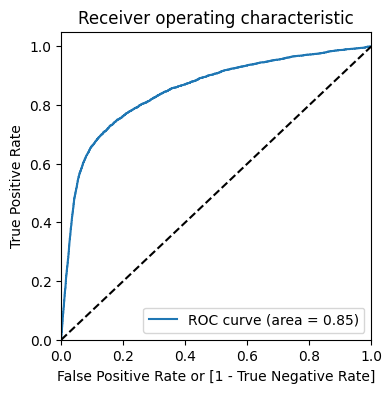

In [91]:
draw_roc_curve(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Churn_Prob)

# Selecting Cutoff

In [92]:
# Selecting the cut off probability above which we will classify customer as churned
num = [float(x)/10 for x in range(10)]
for i in num:
    y_train_pred_final_df[i]= y_train_pred_final_df.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final_df.head()

,True_Churn,Churn_Prob,Pred_Churn,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.013604,0,1,0,0,0,0,0,0,0,0,0
1,0,0.059087,0,1,0,0,0,0,0,0,0,0,0
2,1,0.132038,1,1,1,0,0,0,0,0,0,0,0
3,0,0.042083,0,1,0,0,0,0,0,0,0,0,0
4,0,0.152996,1,1,1,0,0,0,0,0,0,0,0


In [93]:
# Lets check metrics at different cut-off
cut_off_df = pd.DataFrame(columns = ['cut_off','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [float(x)/10 for x in range(10)]
for i in num:
    c_m1 = metrics.confusion_matrix(y_train_pred_final_df.True_Churn, y_train_pred_final_df[i] )
    total1=sum(sum(c_m1))
    accuracy = (c_m1[0,0]+c_m1[1,1])/total1    
    speci = c_m1[0,0]/(c_m1[0,0]+c_m1[0,1])
    sensi = c_m1[1,1]/(c_m1[1,0]+c_m1[1,1])
    cut_off_df.loc[i] =[i,accuracy,sensi,speci]
cut_off_df

,cut_off,accuracy,sensitivity,specificity
0.0,0.0,0.083137,1.000000,0.000000
0.1,0.1,0.756369,0.793434,0.753008
0.2,0.2,0.900106,0.608983,0.926504
0.3,0.3,0.919573,0.283630,0.977238
0.4,0.4,0.919213,0.133151,0.990490
0.5,0.5,0.918493,0.070679,0.995369
0.6,0.6,0.918095,0.041952,0.997540
0.7,0.7,0.917564,0.023484,0.998636
0.8,0.8,0.917659,0.015960,0.999421
0.9,0.9,0.917147,0.006612,0.999711


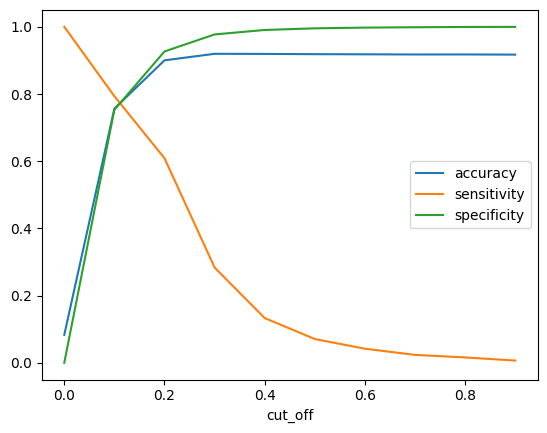

In [94]:
cut_off_df.plot.line(x='cut_off', y=['accuracy','sensitivity','specificity'])
plt.show()

In [95]:
y_train_pred_final_df = pd.DataFrame({'True_Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final_df['Pred_Churn'] = y_train_pred_final_df.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)

In [96]:
# Precision and Recall
print("Precision: ",precision_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))
print("Recall: ",recall_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))
print("F1 Score: ", f1_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))

Precision:  0.22557853114669088
Recall:  0.7934336525307798
F1 Score:  0.35128451017009044


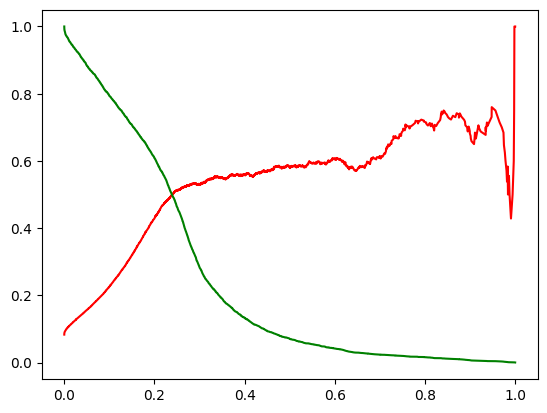

In [97]:
# Precision-Recall curve
p, r, thresholds = precision_recall_curve(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Churn_Prob)
plt.plot(thresholds, p[:-1], "r-")
plt.plot(thresholds, r[:-1], "g-")
plt.show()

# Prediction on test data

In [98]:
X_test_scaled = scaler.transform(X_test[rfe_cols])
X_test_sm = sm.add_constant(X_test_scaled)

In [99]:
y_test_pred = res.predict(X_test_sm)

In [100]:
y_pred_final = pd.DataFrame({"Churn_Prob":y_test_pred, "True_Churn":y_test})
y_pred_final['Pred_Churn'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)
y_pred_final

,Churn_Prob,True_Churn,Pred_Churn
24096,0.413647,1,1
45780,0.033267,0,0
25259,0.149238,0,1
22127,0.088512,0,0
48508,0.157883,0,1
...,...,...,...
45561,0.024915,0,0
29448,0.000015,0,0
5852,0.037828,0,0
67007,0.051787,0,0


In [101]:
confusion_test = metrics.confusion_matrix(y_pred_final.True_Churn, y_pred_final.Pred_Churn )
confusion_test

array([[9069, 3061],
       [ 224,  835]], dtype=int64)

In [102]:
TP = confusion_test[1,1] # true positive 
TN = confusion_test[0,0] # true negatives
FP = confusion_test[0,1] # false positives
FN = confusion_test[1,0] # false negatives

In [103]:
print("Test Accuracy:",metrics.accuracy_score(y_pred_final.True_Churn, y_pred_final.Pred_Churn))
print("Senstivity: ",TP / float(TP+FN))
print("Specificity: ",TN / float(TN+FP))

Test Accuracy: 0.7509288043066191
Senstivity:  0.7884796978281398
Specificity:  0.7476504534212696


In [104]:
# creating a dataframe for model selection
evaluation_df = pd.DataFrame(data=np.zeros((5,2)), index=['Logistic Reg', 'GBM', 'Log Reg with PCA', 'XGBoost', 'Random Forest'], columns=['Accuracy', 'Sensitivity'])
evaluation_df.loc['Logistic Reg', 'Accuracy'] = round(metrics.accuracy_score(y_pred_final.True_Churn, y_pred_final.Pred_Churn), 3)
evaluation_df.loc['Logistic Reg', 'Sensitivity'] = round(TP / float(TP+FN), 3)
evaluation_df

,Accuracy,Sensitivity
Logistic Reg,0.751,0.788
GBM,0.000,0.000
Log Reg with PCA,0.000,0.000
XGBoost,0.000,0.000
Random Forest,0.000,0.000


# Applying PCA

In [105]:
# scaling the features before doing PCA
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train_scaled

array([[ 2.37167189,  2.24727134,  3.80302712, ...,  0.77639897,
        -0.10408593,  0.08231041],
       [-0.33832081, -0.40288395, -0.51875912, ..., -0.57457296,
         0.45014256,  1.22699689],
       [-0.74479922, -0.61668978, -0.479096  , ..., -0.13020194,
         1.14292817, -0.77620444],
       ...,
       [-0.65977021, -0.00497525, -0.7194406 , ...,  1.1419808 ,
        -1.21254291,  1.3700827 ],
       [-0.47935866, -0.09596064, -0.12076815, ...,  0.17760115,
         0.03447119, -0.20386121],
       [-0.36825872, -0.57506516, -0.66002541, ..., -0.56091617,
         0.72725681, -0.63311863]])

In [106]:
# fitting pca model
pca = PCA(random_state=42)
pca.fit(X_train_scaled)
# pca components
pca.components_

array([[ 0.22035742,  0.22878069,  0.21727072, ...,  0.04957098,
        -0.01779005, -0.0099873 ],
       [ 0.1704387 ,  0.18503581,  0.15840008, ..., -0.0973702 ,
         0.0076104 , -0.01034515],
       [-0.08340436, -0.09848639, -0.13163509, ..., -0.07285677,
         0.00850918, -0.01816932],
       ...,
       [ 0.02114658, -0.0610105 , -0.00781336, ...,  0.00102732,
         0.00031504,  0.00109119],
       [-0.00151496,  0.00123061,  0.00087946, ...,  0.00026628,
         0.00050971,  0.00049365],
       [-0.00128644, -0.00342567,  0.00051864, ..., -0.00234567,
         0.00067212,  0.00029365]])

In [107]:
# calculating cumulative variances
var_cumulative = np.cumsum(pca.explained_variance_ratio_)

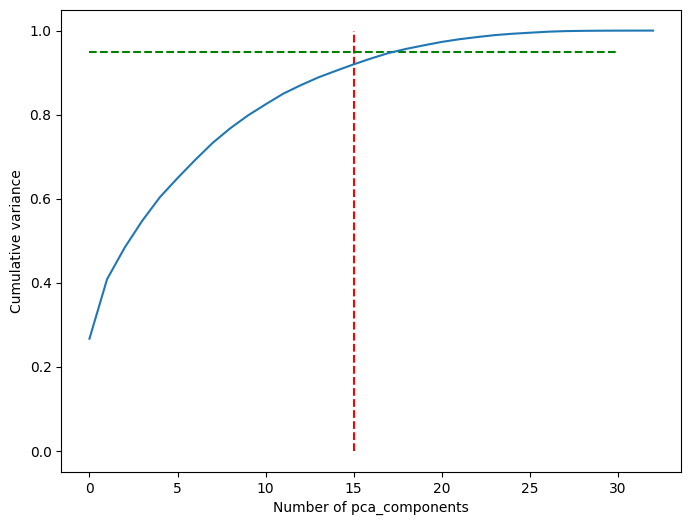

In [108]:
# Cumulative variance explained against number of pca components
fig = plt.figure(figsize=[8,6])
plt.vlines(x=15, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumulative)
plt.ylabel("Cumulative variance")
plt.xlabel("Number of pca_components")
plt.show()

# from the below curve, optimum number of features are 15 to explain 95% variance

In [109]:
pca_final = IncrementalPCA(n_components=15)
X_train_scaled.shape

(52756, 33)

In [110]:
# PCA fitting
df_train_pca = pca_final.fit_transform(X_train_scaled)
df_test_pca = pca_final.transform(X_test_scaled)

In [111]:
corr_mat = np.corrcoef(df_train_pca.transpose())

<Axes: >

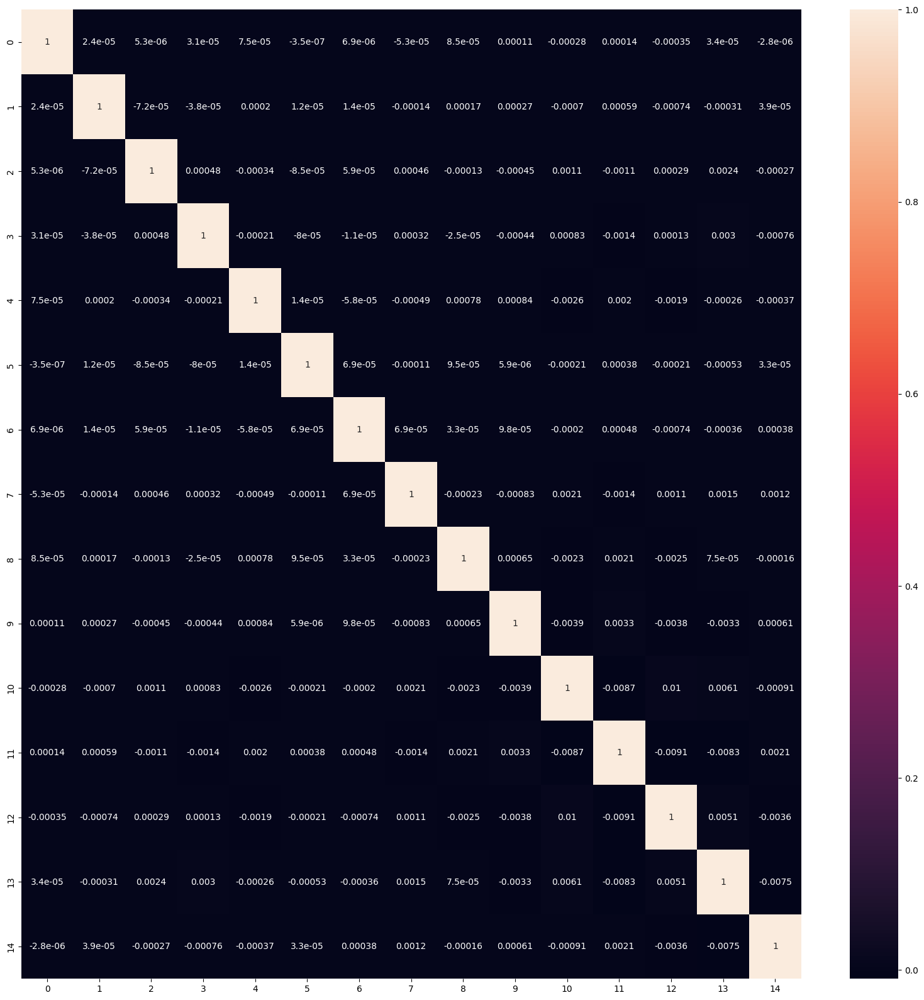

In [112]:
# heatmap for pca components
plt.figure(figsize=[20,20])
sns.heatmap(corr_mat, annot=True)

# clearly no multicollinearity

In [113]:
X_test_scaled = scaler.transform(X_test)
df_test_pca_final = pca_final.transform(X_test_scaled)
df_test_pca_final

array([[-1.70796284,  1.21993223,  0.32563442, ..., -1.16300272,
        -1.46932569, -0.04959829],
       [-1.680507  , -1.07198316,  0.30057271, ..., -0.58692966,
         0.32924018, -0.01335863],
       [-2.38781548, -0.07215321,  0.09770563, ...,  0.64665737,
         0.7343142 ,  0.55755367],
       ...,
       [-0.48812355,  0.82568776,  0.64132892, ..., -0.07496904,
         0.93193978,  0.23031291],
       [-0.52577602,  1.13496618, -1.2000245 , ..., -0.26079961,
         0.15855565,  0.17055268],
       [-2.89135034, -0.10288118,  0.09106814, ...,  0.09378514,
         0.39313841,  0.4724771 ]])

# Logistic Regression with PCA

In [114]:
# fitting LR
X_train_sm = sm.add_constant(df_train_pca)
y_train = pd.DataFrame(y_train)
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
X_test_sm = sm.add_constant(df_test_pca)

In [115]:
# predictions
y_test_pred = res.predict(X_test_sm)

In [116]:
# classifying based on cut off 0.1
y_test_pred_final = pd.DataFrame({'True_Churn':y_test.values, 'Churn_Prob':y_test_pred})
y_test_pred_final['Pred_Churn'] = y_test_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)

In [117]:
print("Test Accuracy :",metrics.accuracy_score(y_test_pred_final.True_Churn, y_test_pred_final.Pred_Churn))
print("Test Sensitivity :",metrics.recall_score(y_test_pred_final.True_Churn, y_test_pred_final.Pred_Churn))

Test Accuracy : 0.7676851922056259
Test Sensitivity : 0.8243626062322946


In [118]:
evaluation_df.loc['Log Reg with PCA', 'Accuracy'] = round(accuracy_score(y_test_pred_final.True_Churn, y_test_pred_final.Pred_Churn), 3)
evaluation_df.loc['Log Reg with PCA', 'Sensitivity'] = round(recall_score(y_test_pred_final.True_Churn, y_test_pred_final.Pred_Churn), 3)
evaluation_df

,Accuracy,Sensitivity
Logistic Reg,0.751,0.788
GBM,0.000,0.000
Log Reg with PCA,0.768,0.824
XGBoost,0.000,0.000
Random Forest,0.000,0.000


# GBM Model

In [119]:
gb = GradientBoostingClassifier(random_state=42)
gb.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 42,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [120]:
# fitting GBM on df_train_pca
gb.fit(df_train_pca, y_train)
gb_pred_train = gb.predict(df_train_pca)
gb_pred_test = gb.predict(df_test_pca)

In [121]:
print("Train Accuracy :", accuracy_score(y_train, gb_pred_train))
print("Train Sensitivity :", recall_score(y_train, gb_pred_train))
print("Test Accuracy :", accuracy_score(y_test, gb_pred_test))
print("Test Sensitivity :", recall_score(y_test, gb_pred_test))

Train Accuracy : 0.9310978846008037
Train Sensitivity : 0.307797537619699
Test Accuracy : 0.9257714762301918
Test Sensitivity : 0.2559017941454202


In [122]:
evaluation_df.loc['GBM', 'Accuracy'] = round(accuracy_score(y_test, gb_pred_test), 3)
evaluation_df.loc['GBM', 'Sensitivity'] = round(recall_score(y_test, gb_pred_test), 3)
evaluation_df

,Accuracy,Sensitivity
Logistic Reg,0.751,0.788
GBM,0.926,0.256
Log Reg with PCA,0.768,0.824
XGBoost,0.000,0.000
Random Forest,0.000,0.000


# XGBoost Classifier

In [123]:
xgb_model = xgb.XGBClassifier(n_jobs = -1,objective = 'binary:logistic')
xgb_model.get_params()

{'objective': 'binary:logistic',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': None,
 'n_jobs': -1,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [124]:
# model fitting
xgb_model.fit(df_train_pca, y_train)
# predictions
xgb_pred = xgb_model.predict(df_test_pca)

In [125]:
print("Test Accuracy :",metrics.accuracy_score(y_test, xgb_pred))
print("Test Sensitivity :",metrics.recall_score(y_test, xgb_pred))

Test Accuracy : 0.9262264007885359
Test Sensitivity : 0.37393767705382436


In [126]:
evaluation_df.loc['XGBoost', 'Accuracy'] = round(accuracy_score(y_test, xgb_pred), 3)
evaluation_df.loc['XGBoost', 'Sensitivity'] = round(recall_score(y_test, xgb_pred), 3)
evaluation_df

,Accuracy,Sensitivity
Logistic Reg,0.751,0.788
GBM,0.926,0.256
Log Reg with PCA,0.768,0.824
XGBoost,0.926,0.374
Random Forest,0.000,0.000


# Random Forest Classifier

In [127]:
# random forest with hyperparameter tuning using GridsearchCV
rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [128]:
# GridSearchCV
params = {
    'max_depth': [40,50,60],
    'min_samples_leaf': [3],
    'min_samples_split':[5],    
    'n_estimators': [95,100,110]
}
grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="accuracy")
print("Number of samples in feature_telecom:", len(feature_telecom))
print("Number of samples in y:", len(y))
grid_search.fit(X,y)

Number of samples in feature_telecom: 69999
Number of samples in y: 65945
Fitting 4 folds for each of 9 candidates, totalling 36 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [40, 50, 60], 'min_samples_leaf': [3],
                         'min_samples_split': [5],
                         'n_estimators': [95, 100, 110]},
             scoring='accuracy', verbose=1)

In [129]:
# checking the best accuracy
grid_search.best_score_

0.9425430132951131

In [130]:
# Best Hyperparameters
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=40, min_samples_leaf=3, min_samples_split=5,
                       n_estimators=95, n_jobs=-1, random_state=42)

In [131]:
rf = RandomForestClassifier(max_depth=50, min_samples_leaf=3, min_samples_split=5,
                       n_estimators=95, n_jobs=-1, random_state=42,oob_score = True)
rf.fit(X,y)

RandomForestClassifier(max_depth=50, min_samples_leaf=3, min_samples_split=5,
                       n_estimators=95, n_jobs=-1, oob_score=True,
                       random_state=42)

In [132]:
print("OOB score: ", rf.oob_score_)

OOB score:  0.9419516263552961


In [133]:
rf_pred = rf.predict(X)

In [134]:
print("Test Accuracy :",metrics.accuracy_score(y, rf_pred))
print("Test Sensitivity :",metrics.recall_score(y, rf_pred))

Test Accuracy : 0.976040639927212
Test Sensitivity : 0.7487603305785124


In [135]:
# Now we can compare all our models by looking at below dataframe of metrics for different models
evaluation_df.loc['Random Forest', 'Accuracy'] = round(accuracy_score(y, rf_pred), 3)
evaluation_df.loc['Random Forest', 'Sensitivity'] = round(recall_score(y, rf_pred), 3)
evaluation_df

,Accuracy,Sensitivity
Logistic Reg,0.751,0.788
GBM,0.926,0.256
Log Reg with PCA,0.768,0.824
XGBoost,0.926,0.374
Random Forest,0.976,0.749


# Model Selection

- We have got two great models :
- i) Logistic Regression with highest sensitivity
- ii) Random Forest with highest accuracy
- Even though Random Forest has little low Sensitivity as compared to Log Reg but it's accuracy is pretty high on test data
- So, let's consider Random Forest for our Kaggle submission
- And Logistic Regression with feature selection using Random Forest and RFE as our final model

# Kaggle Submission

In [4]:
# reading the test file
kaggle_test= pd.read_csv("test.csv")
#kaggle_test["date_of_last_rech_6"] = pd.to_datetime(kaggle_test['date_of_last_rech_6'])
#kaggle_test["date_of_last_rech_7"] = pd.to_datetime(kaggle_test['date_of_last_rech_7'])
#kaggle_test["date_of_last_rech_8"] = pd.to_datetime(kaggle_test['date_of_last_rech_8'])
kaggle_test['rchrge1_no_of_days']=(kaggle_test['date_of_last_rech_7'] - kaggle_test['date_of_last_rech_6']).dt.days
kaggle_test['rchrge2_no_of_days']=(kaggle_test['date_of_last_rech_8'] - kaggle_test['date_of_last_rech_7']).dt.days

kaggle_test = kaggle_test.fillna(0)
kaggle_test = pd.DataFrame(kaggle_test)
kaggle_id = kaggle_test['id']
kaggle_test.head()

KeyError: 'date_of_last_rech_6'

In [2]:
import pandas as pd
df=pd.read_csv("test.csv")

In [3]:
df.shape

(30000, 2)

In [137]:
kaggle_test = kaggle_test[X.columns]

In [138]:
# Kaggle predictions
final_pred_kaggle = rf.predict(kaggle_test)

In [139]:
result = pd.DataFrame({"id":kaggle_id,"churn_probability":final_pred_kaggle})
result.to_csv('Submission.csv', header=True,index=False)

# Conclusion-

- Our primary aim is to reduce customer churn, so it becomes utmost important to identify potential churning customers
- Given this scenario, the most important metric will be SENSITIVITY
- Logistic Regression with feature selection using Random Forest and RFE becomes the best model from business perspective
- This model has
- accuracy = 0.78(78% of the predictions are correct)
- sensitivity = 0.976 (97% of the customers who are churning can be identified)

Most important features are -

- 'arpu_6',
- 'arpu_7',
- 'arpu_8',
- 'roam_og_mou_8',
- 'loc_og_mou_8',
- 'loc_ic_t2t_mou_8',
- 'loc_ic_t2m_mou_8',
- 'loc_ic_mou_7',
- 'std_ic_t2m_mou_8',
- 'total_rech_num_8',
- 'max_rech_amt_8',
- 'last_day_rch_amt_8',
- 'aon',
- 'rchrge1_no_of_days'

STEP 5: Business Recommendations

- Average revenue per user (arpu) shows a constant decline from June to August for churning customers.
- So, sales team may talk to customers who are showing this decreasing trend and may provide discounts and offers as per their need.
- There is a decrease in incoming and outgoing calls usage for churning customers. *If business finds a decrease in the mou then they should try to retain those customers by coming up with better offers, most likely unlimited plans etc. This may be also due to poor network service in some area. In this case, network needs to be improved in that area *
- Same trend is observed with recharge columns. A decrease in average recharge amount or increase in number of days since last recharge is an indicator of churn. Provide offers and discounts
- Age on network 'aon' is also an important feature. Old customers are least likely to churn. However, relatively new customers are most likely to churn. Sales team must provide some offers to new high revenue customers, so that they do not churn